In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from IPython.display import Video
from IPython.display import HTML

In [2]:
!ls -GFlash ../input/deepfake-detection-challenge

total 12K
   0 drwxr-xr-x 4 nobody    0 Jul 11 19:13 ./
4.0K drwxr-xr-x 3 root   4.0K Sep 18 05:31 ../
8.0K -rw-r--r-- 1 nobody 6.7K Jul 11 19:13 sample_submission.csv
   0 drwxr-xr-x 2 nobody    0 Jul 11 19:13 test_videos/
   0 drwxr-xr-x 2 nobody    0 Jul 11 19:13 train_sample_videos/


In [3]:
train_sample_metadata = pd.read_json('../input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [4]:
train_sample_metadata.describe()

,label,split,original
count,400,400,323
unique,2,1,209
top,FAKE,train,meawmsgiti.mp4
freq,323,400,6


In [5]:
train_sample_metadata.groupby('label').count()

,split,original
label,,
FAKE,323,323
REAL,77,0


### Face Detection

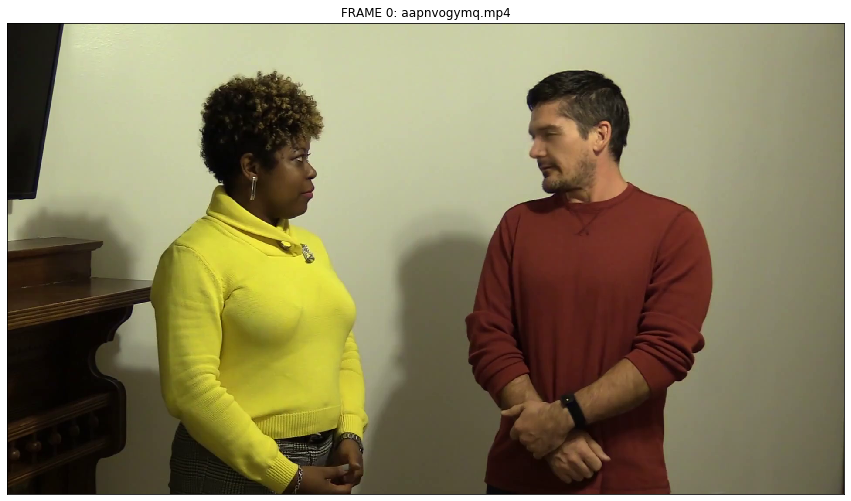

In [6]:
import cv2 as cv
import os
import matplotlib.pylab as plt
train_dir = '/kaggle/input/deepfake-detection-challenge/train_sample_videos/'
fig, ax = plt.subplots(1,1, figsize=(15, 15))
train_video_files = [train_dir + x for x in os.listdir(train_dir)]
# video_file = train_video_files[0]
video_file = '/kaggle/input/deepfake-detection-challenge/train_sample_videos/aapnvogymq.mp4'
cap = cv.VideoCapture(video_file)
success, image = cap.read()
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cap.release()   
ax.imshow(image)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.title.set_text(f"FRAME 0: {video_file.split('/')[-1]}")
plt.grid(False)

In [7]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 3.8MB/s eta 0:00:01


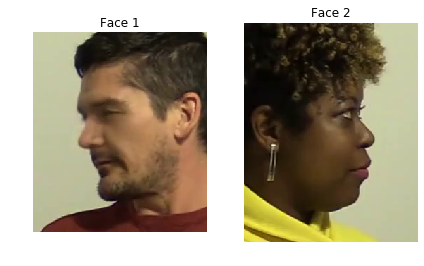

Number of faces detected: 2


In [8]:
from mtcnn import MTCNN

detector = MTCNN()
faces = detector.detect_faces(image)

def crop_face(image, box, pad=60):
    x, y, width, height = box
    x1, y1 = max(0, x - pad), max(0, y - pad)
    x2, y2 = min(image.shape[1], x + width + pad), min(image.shape[0], y + height + pad)
    return image[y1:y2, x1:x2]

for i, face in enumerate(faces):
    # Crop the face with padding
    face_crop = crop_face(image, face['box'])
    
    # Display the cropped face
    plt.subplot(1, len(faces), i+1)
    plt.imshow(face_crop)
    plt.axis('off')
    plt.title(f'Face {i+1}')

plt.tight_layout()
plt.show()
print(f"Number of faces detected: {len(faces)}")

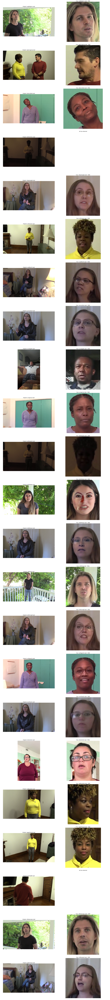

Number of images processed: 23
Number of faces detected: 21


In [9]:
fig, axs = plt.subplots(23, 2, figsize=(20, 180))
axs = axs.flatten()

i = 0
for fn in train_sample_metadata.index[:23]:
    label = train_sample_metadata.loc[fn]['label']
    video_file = os.path.join('/kaggle/input/deepfake-detection-challenge/train_sample_videos', fn)
    
    cap = cv2.VideoCapture(video_file)
    success, image = cap.read()
    cap.release()
    
    if success:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        faces = detector.detect_faces(image)
        
        ax = axs[i]
        ax.imshow(image)
        ax.grid(False)
        ax.set_title(f'Original: {fn}')
        ax.axis('off')
        
        if faces:
            face = faces[0]  # Get the first detected face
            face_crop = crop_face(image, face['box'])
            
            ax2 = axs[i+1]
            ax2.imshow(face_crop)
            ax2.grid(False)
            ax2.set_title(f'Face: {fn} - {label}')
            ax2.axis('off')
        else:
            axs[i+1].axis('off')
            axs[i+1].set_title('No face detected')
        
        i += 2
    
    if i >= len(axs):
        break

plt.tight_layout()
plt.show()

print(f"Number of images processed: {i//2}")
print(f"Number of faces detected: {sum(1 for j in range(0, i, 2) if axs[j+1].get_title() != 'No face detected')}")

### Frame by Frame Face Detection

In [10]:
video_file = '/kaggle/input/deepfake-detection-challenge/train_sample_videos/akxoopqjqz.mp4'

cap = cv2.VideoCapture(video_file)

frames = []
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret==True:
        frames.append(frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
cap.release()

print('The number of frames saved: ', len(frames))

The number of frames saved:  300


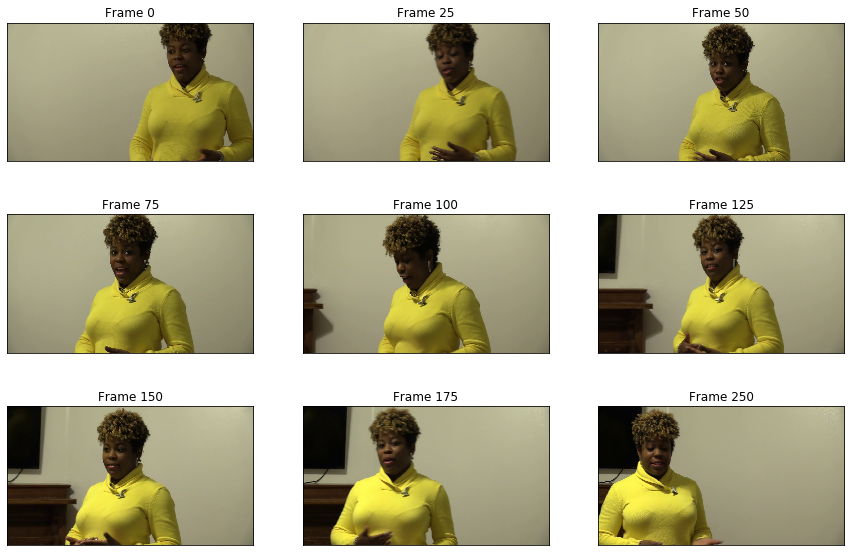

In [11]:


fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = np.array(axes)
axes = axes.reshape(-1)

ax_ix = 0
for i in [0, 25, 50, 75, 100, 125, 150, 175, 250]:
    frame = frames[i]
    #fig, ax = plt.subplots(1,1, figsize=(5, 5))
    image = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
    axes[ax_ix].imshow(image)
    axes[ax_ix].xaxis.set_visible(False)
    axes[ax_ix].yaxis.set_visible(False)
    axes[ax_ix].set_title(f'Frame {i}')
    ax_ix += 1
plt.grid(False)
plt.show()



Could not find face in frame 100


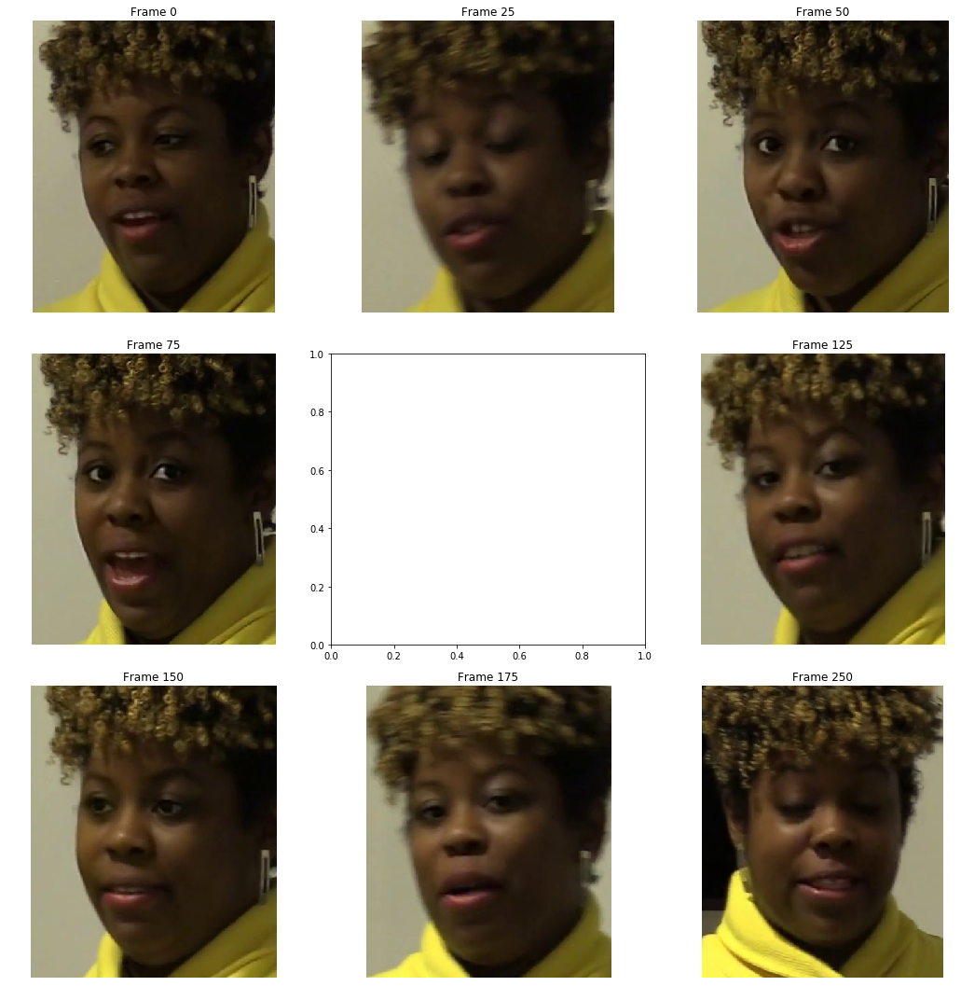

Number of faces detected: 9


In [12]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for ax_ix, i in enumerate([0, 25, 50, 75, 100, 125, 150, 175, 250]):
    if ax_ix >= len(axes):
        break
    
    frame = frames[i]
    faces = detector.detect_faces(frame)
    
    if len(faces) == 0:
        print(f'Could not find face in frame {i}')
        continue
    
    face = faces[0]  # Get the first detected face
    im = crop_face(frame, face['box'])
    image = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    axes[ax_ix].imshow(image)
    axes[ax_ix].axis('off')
    axes[ax_ix].set_title(f'Frame {i}')

plt.tight_layout()
plt.show()

print(f"Number of faces detected: {ax_ix + 1}")

In [13]:
def plot_face_details(image, face):
    # Draw bounding box
    x, y, width, height = face['box']
    cv2.rectangle(image, (x, y), (x + width, y + height), (0, 255, 0), 2)
    
    # Draw facial landmarks
    landmarks = face['keypoints']
    colors = {
        'left_eye': (255, 0, 0),    # Blue
        'right_eye': (0, 0, 255),   # Red
        'nose': (0, 255, 0),        # Green
        'mouth_left': (255, 255, 0),# Cyan
        'mouth_right': (255, 0, 255)# Magenta
    }
    
    for feature, (x, y) in landmarks.items():
        cv2.circle(image, (int(x), int(y)), 2, colors[feature], 2)
    
    return image

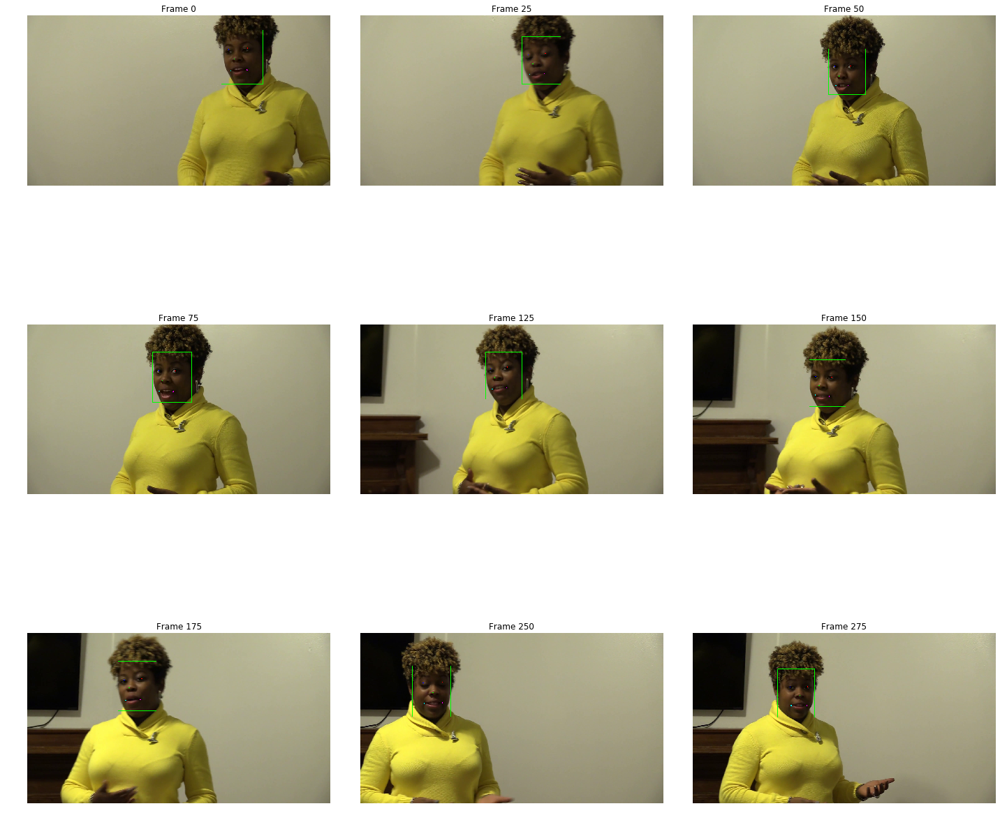

Number of frames with detected faces: 9


In [14]:
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.flatten()

for ax_ix, i in enumerate([0, 25, 50, 75, 125, 150, 175, 250, 275]):
    if ax_ix >= len(axes):
        break
    
    frame = frames[i].copy()  
    faces = detector.detect_faces(frame)
    
    if len(faces) == 0:
        print(f'Could not find face in frame {i}')
        continue
    
    for face in faces:
        frame = plot_face_details(frame, face)
    
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    axes[ax_ix].imshow(image)
    axes[ax_ix].axis('off')
    axes[ax_ix].set_title(f'Frame {i}')

plt.tight_layout()
plt.show()

print(f"Number of frames with detected faces: {ax_ix + 1}")

### Resizing and Normalization

In [15]:
# import torchvision.transforms as transforms

# # Transform pipeline: Resize, Normalize, and ToTensor
# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet stats
# ])

In [16]:
# from torchvision.transforms import RandomHorizontalFlip, RandomRotation, ColorJitter


# augmentation = transforms.Compose([
#     RandomHorizontalFlip(p=0.5),
#     RandomRotation(degrees=15),
#     ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
# ])


# train_transform = transforms.Compose([
#     augmentation,
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])


# val_transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

In [17]:
# import torch
# import torch.nn as nn
# import torchvision.models as models

# class DeepfakeDetector(nn.Module):
#     def __init__(self, num_classes=2):
#         super(DeepfakeDetector, self).__init__()
#         self.resnet = models.resnet50(pretrained=True)
#         num_ftrs = self.resnet.fc.in_features
#         self.resnet.fc = nn.Sequential(
#             nn.Linear(num_ftrs, 256),
#             nn.ReLU(),
#             nn.Dropout(0.5),
#             nn.Linear(256, num_classes)
#         )

#     def forward(self, x):
#         return self.resnet(x)

# # Initialize the model
# model = DeepfakeDetector()

# # Loss function
# criterion = nn.CrossEntropyLoss()

# # Optimizer
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# # Learning rate scheduler
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [18]:
import torch
from torch.utils.data import Dataset, DataLoader
import os
import cv2
import numpy as np
import pandas as pd
from mtcnn import MTCNN
from PIL import Image
import torchvision.transforms as transforms

# Define the transforms
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class DFDCDataset(Dataset):
    def __init__(self, metadata_path, video_dir, transform=None, max_frames=30):
        self.metadata = pd.read_json(metadata_path).T
        self.video_dir = video_dir
        self.transform = transform
        self.max_frames = max_frames
        self.detector = MTCNN()

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        video_name = self.metadata.index[idx]
        label = 1 if self.metadata.iloc[idx]['label'] == 'FAKE' else 0
        video_path = os.path.join(self.video_dir, video_name)

        frames = self.extract_frames(video_path)
        faces = self.extract_faces(frames)

        if self.transform:
            faces = [self.transform(Image.fromarray(face)) for face in faces]

        # Pad or truncate to max_frames
        if len(faces) > self.max_frames:
            faces = faces[:self.max_frames]
        else:
            faces += [torch.zeros_like(faces[0])] * (self.max_frames - len(faces))

        return torch.stack(faces), label

    def extract_frames(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frames = []
        while len(frames) < self.max_frames:
            ret, frame = cap.read()
            if not ret:
                break
            frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        cap.release()
        return frames

    def extract_faces(self, frames):
        faces = []
        for frame in frames:
            detected_faces = self.detector.detect_faces(frame)
            if detected_faces:
                face = self.crop_face(frame, detected_faces[0]['box'])
                faces.append(face)
        return faces

    def crop_face(self, image, box, pad=60):
        x, y, width, height = box
        x1, y1 = max(0, x - pad), max(0, y - pad)
        x2, y2 = min(image.shape[1], x + width + pad), min(image.shape[0], y + height + pad)
        return image[y1:y2, x1:x2]

# Create train and validation datasets
train_dataset = DFDCDataset(
    metadata_path='../input/deepfake-detection-challenge/train_sample_videos/metadata.json',
    video_dir='../input/deepfake-detection-challenge/train_sample_videos',
    transform=train_transform
)

val_dataset = DFDCDataset(
    metadata_path='../input/deepfake-detection-challenge/train_sample_videos/metadata.json',
    video_dir='../input/deepfake-detection-challenge/train_sample_videos',
    transform=val_transform
)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=0)

In [ ]:
import cv2
print(cv2.data.haarcascades)
!ls /opt/conda/lib/python3.6/site-packages/cv2/data/
!cat /opt/conda/lib/python3.6/site-packages/cv2/data/haarcascade_frontalface_alt_tree.xml

In [25]:
!pip install dlib

  Using cached https://files.pythonhosted.org/packages/3c/07/a2693a94ac678c442c4cfe269d24f63053b14410ef2d09957a762eeb4b8e/dlib-19.24.6.tar.gz
  ERROR: Command errored out with exit status 1:
   command: /opt/conda/bin/python -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/tmp/pip-install-qpwlwjlx/dlib/setup.py'"'"'; __file__='"'"'/tmp/pip-install-qpwlwjlx/dlib/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d /tmp/pip-wheel-o0_9kdlh --python-tag cp36
       cwd: /tmp/pip-install-qpwlwjlx/dlib/
  Complete output (43 lines):
  running bdist_wheel
  running build
  running build_ext
  cmake: /opt/conda/lib/libcurl.so.4: no version information available (required by cmake)
  Building extension for Python 3.6.6 |Anaconda, Inc.| (default, Oct  9 2018, 12:34:16)
  Invoking CMake setup: 'cmake /tmp/pip-install-qpwlwjlx/dlib/tools/python -DCMAK

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import models
import cv2
import dlib  # for facial landmark detection

class FaceSwapDeepfakeDetector(nn.Module):
    def __init__(self, num_classes=2):
        super(FaceSwapDeepfakeDetector, self).__init__()
        # Face detector and facial landmark detector
        self.face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + '/opt/conda/lib/python3.6/site-packages/cv2/data/haarcascade_frontalface_default.xml')
        self.landmark_detector = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')  # Download dlib model
        self.face_tracker = None

        # Pre-trained ResNet model for feature extraction
        self.resnet = models.resnet50(pretrained=True)
        self.resnet = nn.Sequential(*list(self.resnet.children())[:-1])  # Remove the last FC layer

        # LSTM for temporal analysis
        self.lstm = nn.LSTM(2048, 512, batch_first=True)

        # Fully connected layer for classification
        self.fc = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def detect_and_align_face(self, frame):
        """Detect and align the face using landmarks"""
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Use tracker if face has been detected in the previous frame
        if self.face_tracker is not None:
            success, bbox = self.face_tracker.update(frame)
            if success:
                (x, y, w, h) = tuple(map(int, bbox))
                face = frame[y:y+h, x:x+w]
                return self.align_face(face)
            else:
                self.face_tracker = None  # Revert to detection if tracking fails

        # Detect face with Haar cascade
        faces = self.face_detector.detectMultiScale(gray, 1.1, 4)
        if len(faces) == 0:
            return None
        
        (x, y, w, h) = faces[0]
        face = frame[y:y+h, x:x+w]

        # Initialize tracker after first detection
        self.face_tracker = cv2.TrackerKCF_create()
        self.face_tracker.init(frame, tuple(faces[0]))

        # Align the face before returning
        return self.align_face(face)

    def align_face(self, face):
        """Align the face based on facial landmarks"""
        face_rgb = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        rect = dlib.rectangle(0, 0, face.shape[1], face.shape[0])
        landmarks = self.landmark_detector(face_rgb, rect)

        # Simple alignment based on eye landmarks (this can be refined)
        left_eye = (landmarks.part(36).x, landmarks.part(36).y)
        right_eye = (landmarks.part(45).x, landmarks.part(45).y)
        # Align using affine transformation
        return self.apply_affine_transform(face, left_eye, right_eye)

    def apply_affine_transform(self, face, left_eye, right_eye):
        """Perform affine transformation to align the face"""
        dx = right_eye[0] - left_eye[0]
        dy = right_eye[1] - left_eye[1]
        angle = np.degrees(np.arctan2(dy, dx))
        center = tuple(np.mean([left_eye, right_eye], axis=0).astype(int))
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale=1)
        aligned_face = cv2.warpAffine(face, rotation_matrix, (224, 224))
        return cv2.resize(aligned_face, (224, 224))

    def forward(self, x):
        # x shape: (batch_size, num_frames, channels, height, width)
        batch_size, num_frames, c, h, w = x.shape
        face_features = []

        for i in range(batch_size):
            video = x[i]
            video_face_features = []

            for frame in video:
                frame = frame.permute(1, 2, 0).cpu().numpy()
                face = self.detect_and_align_face(frame)

                if face is not None:
                    face = torch.from_numpy(face).permute(2, 0, 1).unsqueeze(0).float().to(x.device)
                    feature = self.resnet(face)
                    video_face_features.append(feature.squeeze())
            
            # Stack features or handle missing frames
            if video_face_features:
                video_face_features = torch.stack(video_face_features)
            else:
                video_face_features = torch.zeros(num_frames, 2048).to(x.device)

            face_features.append(video_face_features)

        face_features = torch.stack(face_features)

        # Pass through LSTM
        lstm_out, _ = self.lstm(face_features)
        lstm_out = lstm_out[:, -1, :]  # Use the last LSTM output
        out = self.fc(lstm_out)
        return out

# Usage
model = FaceSwapDeepfakeDetector().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    all_preds = []
    all_labels = []
    for batch in tqdm(loader, desc="Training"):
        frames, labels = batch
        frames, labels = frames.to(device), labels.to(device)
        
        optimizer.zero_grad()
        
        # Reshape frames to (batch_size * max_frames, channels, height, width)
        b, f, c, h, w = frames.shape
        frames = frames.view(b * f, c, h, w)
        
        outputs = model(frames)
        
        # Reshape outputs back to (batch_size, max_frames, num_classes)
        outputs = outputs.view(b, f, -1)
        
        # Average predictions across frames
        outputs = outputs.mean(dim=1)
        
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())
    avg_loss = total_loss / len(loader)
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    return avg_loss, accuracy, precision, recall, f1

def validate(model, loader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for batch in tqdm(loader, desc="Validating"):
            frames, labels = batch
            frames, labels = frames.to(device), labels.to(device)
            
            b, f, c, h, w = frames.shape
            frames = frames.view(b * f, c, h, w)
            
            outputs = model(frames)
            outputs = outputs.view(b, f, -1)
            outputs = outputs.mean(dim=1)
            
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
    avg_loss = total_loss / len(loader)
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    return avg_loss, accuracy, precision, recall, f1

# Training setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DeepfakeDetector().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

num_epochs = 10
best_val_loss = float('inf')
patience = 3
counter = 0

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    
    train_loss, train_acc, train_prec, train_rec, train_f1 = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_prec, val_rec, val_f1 = validate(model, val_loader, criterion, device)
    
    scheduler.step()
    
    print(f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Prec: {train_prec:.4f}, Rec: {train_rec:.4f}, F1: {train_f1:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, Prec: {val_prec:.4f}, Rec: {val_rec:.4f}, F1: {val_f1:.4f}")
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        torch.save(model.state_dict(), 'model.pth')
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping")
            break

print("Training completed")

ModuleNotFoundError: No module named 'dlib'

## Model Training

In [ ]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.utils.data import Dataset, DataLoader
# import torchvision.transforms as transforms
# from torchvision import models
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from tqdm import tqdm
# import os
# import cv2
# import numpy as np
# import pandas as pd
# from mtcnn import MTCNN
# from PIL import Image

# print("Script started")

# # Define the transforms
# train_transform = transforms.Compose([
#     transforms.RandomHorizontalFlip(p=0.5),
#     transforms.RandomRotation(degrees=15),
#     transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

# val_transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

# class DFDCDataset(Dataset):
#     def __init__(self, metadata_path, video_dir, transform=None, max_frames=30):
#         self.metadata = pd.read_json(metadata_path).T
#         self.video_dir = video_dir
#         self.transform = transform
#         self.max_frames = max_frames
#         self.detector = MTCNN()

#     def __len__(self):
#         return len(self.metadata)

#     def __getitem__(self, idx):
#         video_name = self.metadata.index[idx]
#         label = 1 if self.metadata.iloc[idx]['label'] == 'FAKE' else 0
#         video_path = os.path.join(self.video_dir, video_name)

#         frames = self.extract_frames(video_path)
#         faces = self.extract_faces(frames)

#         if self.transform:
#             faces = [self.transform(Image.fromarray(face)) for face in faces]

#         # Pad or truncate to max_frames
#         if len(faces) > self.max_frames:
#             faces = faces[:self.max_frames]
#         else:
#             faces += [torch.zeros_like(faces[0])] * (self.max_frames - len(faces))

#         return torch.stack(faces), label

#     def extract_frames(self, video_path):
#         cap = cv2.VideoCapture(video_path)
#         frames = []
#         while len(frames) < self.max_frames:
#             ret, frame = cap.read()
#             if not ret:
#                 break
#             frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
#         cap.release()
#         return frames

#     def extract_faces(self, frames):
#         faces = []
#         for frame in frames:
#             detected_faces = self.detector.detect_faces(frame)
#             if detected_faces:
#                 face = self.crop_face(frame, detected_faces[0]['box'])
#                 faces.append(face)
#         return faces

#     def crop_face(self, image, box, pad=60):
#         x, y, width, height = box
#         x1, y1 = max(0, x - pad), max(0, y - pad)
#         x2, y2 = min(image.shape[1], x + width + pad), min(image.shape[0], y + height + pad)
#         return image[y1:y2, x1:x2]

# # Create train and validation datasets
# train_dataset = DFDCDataset(
#     metadata_path='../input/deepfake-detection-challenge/train_sample_videos/metadata.json',
#     video_dir='../input/deepfake-detection-challenge/train_sample_videos',
#     transform=train_transform
# )

# val_dataset = DFDCDataset(
#     metadata_path='../input/deepfake-detection-challenge/train_sample_videos/metadata.json',
#     video_dir='../input/deepfake-detection-challenge/train_sample_videos',
#     transform=val_transform
# )

# # Create dataloaders
# train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=1)
# val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=1)

# print(f"Number of training samples: {len(train_dataset)}")
# print(f"Number of validation samples: {len(val_dataset)}")

In [ ]:
# # Check a single batch
# for batch in train_loader:
#     frames, labels = batch
#     print(f"Batch shape: {frames.shape}")
#     print(f"Labels shape: {labels.shape}")
#     break

# # Define the DeepfakeDetector model
# class DeepfakeDetector(nn.Module):
#     def __init__(self, num_classes=2):
#         super(DeepfakeDetector, self).__init__()
#         self.resnet = models.resnet50(pretrained=True)
#         num_ftrs = self.resnet.fc.in_features
#         self.resnet.fc = nn.Sequential(
#             nn.Linear(num_ftrs, 256),
#             nn.ReLU(),
#             nn.Dropout(0.5),
#             nn.Linear(256, num_classes)
#         )

#     def forward(self, x):
#         return self.resnet(x)

# def train_epoch(model, loader, optimizer, criterion, device):
#     model.train()
#     total_loss = 0
#     all_preds = []
#     all_labels = []
#     for batch in tqdm(loader, desc="Training"):
#         frames, labels = batch
#         frames, labels = frames.to(device), labels.to(device)
        
#         optimizer.zero_grad()
        
#         # Reshape frames to (batch_size * max_frames, channels, height, width)
#         b, f, c, h, w = frames.shape
#         frames = frames.view(b * f, c, h, w)
        
#         outputs = model(frames)
        
#         # Reshape outputs back to (batch_size, max_frames, num_classes)
#         outputs = outputs.view(b, f, -1)
        
#         # Average predictions across frames
#         outputs = outputs.mean(dim=1)
        
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()
        
#         total_loss += loss.item()
        
#         preds = torch.argmax(outputs, dim=1).cpu().numpy()
#         all_preds.extend(preds)
#         all_labels.extend(labels.cpu().numpy())
#     avg_loss = total_loss / len(loader)
#     accuracy = accuracy_score(all_labels, all_preds)
#     precision = precision_score(all_labels, all_preds, average='weighted')
#     recall = recall_score(all_labels, all_preds, average='weighted')
#     f1 = f1_score(all_labels, all_preds, average='weighted')
#     return avg_loss, accuracy, precision, recall, f1

# def validate(model, loader, criterion, device):
#     model.eval()
#     total_loss = 0
#     all_preds = []
#     all_labels = []
#     with torch.no_grad():
#         for batch in tqdm(loader, desc="Validating"):
#             frames, labels = batch
#             frames, labels = frames.to(device), labels.to(device)
            
#             b, f, c, h, w = frames.shape
#             frames = frames.view(b * f, c, h, w)
            
#             outputs = model(frames)
#             outputs = outputs.view(b, f, -1)
#             outputs = outputs.mean(dim=1)
            
#             loss = criterion(outputs, labels)
#             total_loss += loss.item()
            
#             preds = torch.argmax(outputs, dim=1).cpu().numpy()
#             all_preds.extend(preds)
#             all_labels.extend(labels.cpu().numpy())
#     avg_loss = total_loss / len(loader)
#     accuracy = accuracy_score(all_labels, all_preds)
#     precision = precision_score(all_labels, all_preds, average='weighted')
#     recall = recall_score(all_labels, all_preds, average='weighted')
#     f1 = f1_score(all_labels, all_preds, average='weighted')
#     return avg_loss, accuracy, precision, recall, f1

# # Training setup
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f"Using device: {device}")

# model = DeepfakeDetector().to(device)
# criterion = nn.CrossEntropyLoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# num_epochs = 10
# best_val_loss = float('inf')
# patience = 3
# counter = 0

# print("Starting training loop")

# for epoch in range(num_epochs):
#     print(f"Epoch {epoch+1}/{num_epochs}")
    
#     print("Starting training...")
#     train_loss, train_acc, train_prec, train_rec, train_f1 = train_epoch(model, train_loader, optimizer, criterion, device)
#     print("Training completed.")
    
#     print("Starting validation...")
#     val_loss, val_acc, val_prec, val_rec, val_f1 = validate(model, val_loader, criterion, device)
#     print("Validation completed.")
    
#     scheduler.step()
    
#     print(f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Prec: {train_prec:.4f}, Rec: {train_rec:.4f}, F1: {train_f1:.4f}")
#     print(f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, Prec: {val_prec:.4f}, Rec: {val_rec:.4f}, F1: {val_f1:.4f}")
    
#     # Early stopping
#     if val_loss < best_val_loss:
#         best_val_loss = val_loss
#         counter = 0
#         torch.save(model.state_dict(), 'best_model.pth')
#     else:
#         counter += 1
#         if counter >= patience:
#             print("Early stopping")
#             break

# print("Training completed")